# GAN para generación de rostros de anime V5


## Inicialización

Comenzamos por importar las librerías que consideramos necesarias, siendo las principales las correspondientes a Pytorch como torch y torchvision con sus respectivos módulos. Junto a ello, importamos otras librerías de uso general como pandas, matplotlib, numpy y random.



In [3]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
# Este comando nos permitirá realizar un seguimiento de la depuración ocurrida durante el uso de CUDA


import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import torchvision.datasets as dtst
from torch import optim

from PIL import Image

import random
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Retiramos los mensajes de alerta
import warnings
warnings.filterwarnings('ignore')

# Inicializamos las semillas de los valores aleatorios
random.seed(55)
torch.manual_seed(71)

%matplotlib inline

In [4]:
# Path de la carpeta donde se ubican las imágenes de entrenamiento
data_folder = './images'

# Tamaño que deseamos que tengan las imágenes
image_size = 128
# Tamaño del lote de imágenes
batch_size = 64


dsimgs = dtst.ImageFolder(
    root=data_folder,
    transform=transforms.Compose([
        # Se usa el resize en caso no todas las imágenes de entrada tengan el tamaño de 128px
        transforms.Resize(image_size),
        # CenterCrop busca recortar la imagen en caso sea muy grande al tamaño dado
        transforms.CenterCrop(image_size),
        # ToTensor convierte finalmente la imagen a tensor
        transforms.ToTensor(),
        # Normalize permite la normalización de la información
        # El problema encontrado es que necesitamos hallar la desviación estandar
        # media de toda la información para realizar una correcta normalización
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]))

dt_loader = DataLoader(dsimgs,
                       batch_size=batch_size,
                       shuffle=True,
                       num_workers=1,
                       drop_last=True)

# Forzamos el uso de CUDA
device = torch.device('cuda:0')

#### Visualización de lote de imágenes de entrenamiento

Mostraremos un pequeño conjunto de imágenes pertenecientes al conjunto de entrenamiento

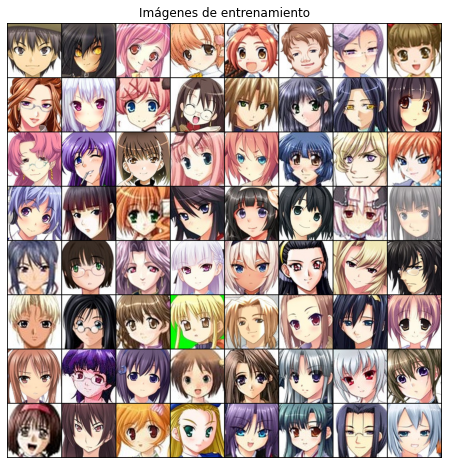

In [5]:
batch_imagenes = next(iter(dt_loader))
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Imágenes de entrenamiento")
plt.imshow(
    np.transpose(
        make_grid(batch_imagenes[0].to(device)[:64], padding=2,
                  normalize=True).cpu(), (1, 2, 0)))

#### Función generadora de vector de ruido

Lo que hará la función $noise\_generator$ será recibir como parámetros $n:$ que será el parámetro que pertenece a la forma que tendrá el vector de ruido, esto es el tamaño del batch en el dataloader. El parámetro $dimension$ es la dimensión que tendrá el vector de ruido, más adelante lo conoceremos como $dim\_z$. $device$ es el parámetro que indicará si el tensor se cargará en una GPU o en una CPU.

In [6]:
def noise_generator(n, dimension, device):
    return torch.randn(n, dimension, device=device)

#### Función de visualización durante el entrenamiento
Implementaremos una función genérica que se encargará de mostrar las imágenes en un tensor dado.

In [7]:
def show_tensor_images(image_tensor, num_images=9, size=(1, 50, 50)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=3)
    # image_grid.permute se encargará de convertir el tensor de 3 canales(RGB)
    # en una sola imagen de 1 canal
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()
    

#### Parámetros
En esta celda definiremos algúnos de los parámetros generales que se usarán a lo largo de la implementación de la GAN

In [8]:
# dim_z es la cantidad de canales del vector de ruido de entrada
dim_z = 100 # probando con dim_z=100
# ch_rgb son los canales 3 canales de color
ch_rgb = 3
# gd_hidd_ch es el valor base que tendrá la dimensión de los tensores 
# durante las convoluciones ocultas en el generador y en el discriminador
gd_hidd_ch = 64 
# el ratio de aprendizaje es la distancia que recorre el punto de 
# optimización al tomarse la gradiente del modelo para encontrar 
# mínimos locales o globales y así optimizar el modelo
lr_d = 0.0005
lr_g = 0.001

# Función de inicialización de pesos
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02) 
        #Probando (m.weight.data, 0.0, 0.02) en lugar de (m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

### RED GENERADORA

Implementaremos una red generadora, como base se ha usado el modelo de DCGAN y RESNET para obtener un modelo no tan pesado.

El modelo consta de 9 capas, en donde la primera capa incluye $ConvTranspose2d$, $BatchNorm2d$, $DropOut$ y $UpSampling$.

Las otras capas usan un intercalado entre:
- Usar $ConvTranspose2d$, $BatchNorm2d$ y $ReLU$ ademas de mantener el tamaño de la dimension y de la imagen.
- Usar $ConvTranspose2d$, $BatchNorm2d$, $DropOut$  y ReLU ademas de reducir a la mitad el tamaño de la dimension.

Para la capa final, realizamos una $ConvTranspose2d$, $BatchNorm2d$ y finalmente aplicamos la función $Tanh()$ como función de activación final.

In [9]:
class redGeneradora(nn.Module):
    def __init__(self, dim_z=200, ch_rgb=3, hidd_ch=64):
        
        super(redGeneradora, self).__init__()
        
        self.z_dim=dim_z
        self.main = nn.Sequential(            
            ### INICIAL ###
            # In: 200*1*1 -> out: 512*8*8
            self.gen_blocks(dim_z, hidd_ch*8,i_layer=True),  # Obtenemos un Tensor 512*8*8
            
            ### BLOQUES###
            self.gen_blocks(hidd_ch*8, hidd_ch*8),
            self.gen_blocks(hidd_ch*8, hidd_ch*4, change_block=True),
            self.gen_blocks(hidd_ch*4, hidd_ch*4),
            self.gen_blocks(hidd_ch*4, hidd_ch*2, change_block=True),
            self.gen_blocks(hidd_ch*2, hidd_ch*2),
            self.gen_blocks(hidd_ch*2, hidd_ch, change_block=True),
            self.gen_blocks(hidd_ch, hidd_ch),
          
            ### FINAL ###
            self.final_block(hidd_ch, ch_rgb) # Obtenemos un Tensor 3*128*128
        )
    def final_block(self, inp_ch=64, out_ch=3, kernel=4, stride=2, padding=1):
        return nn.Sequential(
            nn.ConvTranspose2d(inp_ch,out_ch, kernel_size=kernel,stride=stride, padding=padding, bias=False),
            nn.BatchNorm2d(out_ch), # Probamos el uso de DropOut
#             nn.Dropout(0.5),
            nn.Tanh()
            )
    
    # Para mejorar la estética y evitar redundancia de código se usa una función generadora de bloques secuenciales
    def gen_blocks(self, inp_ch, out_ch, kernel=3, stride=1, padding=1, change_block=False,  i_layer=False):
        if not i_layer:
            # Este bloque mantiene el tamaño de la dimensión y de la imagen
            if not change_block:
                return nn.Sequential(
                    nn.ConvTranspose2d(inp_ch, out_ch, kernel, stride, padding, bias = False),
                    nn.BatchNorm2d(out_ch),
                    # nn.Dropout(0.25),# Probamos el uso de DropOut
                    nn.ReLU( inplace=True)
                )
            else:
                # En este bloque se duplica la dimensionalidad de características(z)
                return nn.Sequential(
                    nn.ConvTranspose2d(inp_ch, out_ch, kernel_size=4, stride=2, padding=padding, bias = False),
                    nn.BatchNorm2d(out_ch),
                    nn.Dropout(0.25),# Probamos el uso de DropOut
                    nn.ReLU( inplace=True)
                )
        else:
            return nn.Sequential(
                # Esta convolución + Sigmoid se puede cambiar por una Linear de 512 -> 1?
                nn.ConvTranspose2d(inp_ch, out_ch, kernel_size=4, stride=1, padding=0, bias = False),
                nn.BatchNorm2d(out_ch),
                nn.Dropout(0.25),# Probamos el uso de DropOut
                # remuestrea hasta 8*8
                nn.UpsamplingBilinear2d(scale_factor=2)
            )
        
        
    def forward(self, input_t):
        # El tensor de ruido se redimensiona a 1*1*dim_Z donde 
        # dim_Z son los canales de entrada
        x = input_t.view(len(input_t), self.z_dim, 1, 1)
        return self.main(x)

##### Instanciado del modelo generador

In [10]:
# Instanciamos el modelo
anime_gen = redGeneradora(dim_z, ch_rgb, gd_hidd_ch).to(device)

# Asignamos pesos a la red generadora
anime_gen = anime_gen.apply(weights_init)

# Instanciamos su optimizador
gen_optim = torch.optim.Adam(anime_gen.parameters(), lr=lr_g, betas=(0.5, 0.999) )

### RED DISCRIMINANTE
Implementaremos una red discriminante, como base se ha usado el modelo de DCGAN y RESNET para obtener un modelo no tan pesado.

El modelo consta de 7 capas, en donde la primera capa realiza un $Conv2d$,un $BatchNorm2d$,un $LeakyReLU$ y un $MaxPool2d$.

Las otras capas usan un intercalado entre:
- Usar $Conv2d$, $BatchNorm2d$ y $LeakyReLU$ ademas de mantener el tamaño de la dimension y de la imagen.
- Usar $Conv2d$, $BatchNorm2d$  y $LeakyReLU$  ademas de aumentar al doble el tamaño de la dimension.

Para la capa final, realizamos una $AvgPool2d$, $Conv2d$ y finalmente aplicamos la función $Sigmoid()$ como función de activación final.

In [11]:
class redDiscriminadora(nn.Module):
    def __init__(self, dim_z=200, ch_rgb=3, hidd_ch=64):
        super(redDiscriminadora, self).__init__()
        self.z_dim=dim_z
        self.main = nn.Sequential(
            ### INICIAL ###
            # In: 3*128*128 -> out: 64*32*32
            self.initial_block(ch_rgb, hidd_ch),
            self.gen_blocks(hidd_ch, hidd_ch),
            self.gen_blocks(hidd_ch, hidd_ch*2, change_block=True),
            self.gen_blocks(hidd_ch*2, hidd_ch*2),
            self.gen_blocks(hidd_ch*2, hidd_ch*4, change_block=True),
            self.gen_blocks(hidd_ch*4, hidd_ch*8, change_block=True),
            self.gen_blocks(hidd_ch*8, 1,f_layer=True)  # Obtenemos un "Tensor" 1*1*1
        )
    def initial_block(self, inp_ch=3, out_ch=64, kernel=7, stride=2, padding=3):
        return nn.Sequential(
            nn.Conv2d(inp_ch,out_ch, kernel_size=kernel,stride=stride, padding=padding, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.LeakyReLU( 0.05 ,inplace=True),
            nn.MaxPool2d(kernel_size=kernel ,stride=2,padding=1)
            )
    
    # Para mejorar la estética y evitar redundancia de código se usa una función generadora de bloques secuenciales
    def gen_blocks(self, inp_ch, out_ch, kernel=3, stride=1, padding=1, change_block=False,  f_layer=False):
        if not f_layer:
            # Este bloque mantiene el tamaño de la dimensión y de la imagen
            if not change_block:
                return nn.Sequential(
                    nn.Conv2d(inp_ch, out_ch, kernel, stride, padding, bias = False),
                    nn.BatchNorm2d(out_ch),
                    nn.LeakyReLU(0.05, inplace=True),
#                     nn.Conv2d(inp_ch, out_ch, kernel, stride, padding, bias = False),
#                     nn.BatchNorm2d(out_ch),
                )
            else:
                # En este bloque se duplica la dimensionalidad de características(z)
                return nn.Sequential(
                    nn.Conv2d(inp_ch, out_ch, kernel, stride=2, padding=padding, bias = False),
                    nn.BatchNorm2d(out_ch),
                    nn.LeakyReLU(0.05, inplace=True),
#                     nn.Conv2d(out_ch, out_ch, kernel, stride, padding, bias = False),
#                     nn.BatchNorm2d(out_ch),
                )
        else:
            return nn.Sequential(
                nn.AvgPool2d(4),
                # Esta convolución + Sigmoid se puede cambiar por una Linear de 512 -> 1?
                nn.Conv2d(inp_ch, out_ch, kernel_size=1, stride=1, padding=0, bias = False),
                nn.Sigmoid()
            )
        
        
    def forward(self, input_arr):
        y = self.main(input_arr)
        return y.view(len(y), -1)

##### Instanciando el modelo Discriminador

In [12]:
# Instanciamos el modelo
anime_dis = redDiscriminadora(dim_z, ch_rgb, gd_hidd_ch).to(device)

# Asignamos pesos a la red generadora
anime_dis = anime_dis.apply(weights_init)

# Instanciamos su optimizador
dis_optim = torch.optim.Adam(anime_dis.parameters(), lr=lr_d, betas=(0.5, 0.999))
# En versión 3, al usar0 SGD para el discriminador no se obtuvo mejoras
# torch.optim.SGD(anime_dis.parameters(), lr=lr, momentum=0.9)

##### Instanciamos la función de pérdida

In [13]:
criterion = nn.BCELoss()

In [1]:
def display_losses(cur_step, display_step, generator_losses,
                   discriminator_losses):
    if cur_step % display_step == 0 and cur_step > 0:
        gen_mean = sum(generator_losses[-display_step:]) / display_step
        disc_mean = sum(discriminator_losses[-display_step:]) / display_step
        step_bins = 20
        x_axis = sorted(
            [i * step_bins
             for i in range(len(generator_losses) // step_bins)] * step_bins)
        num_examples = (len(generator_losses) // step_bins) * step_bins
        plt.plot(range(num_examples // step_bins),
                 torch.Tensor(generator_losses[:num_examples]).view(
                     -1, step_bins).mean(1),
                 label="Generator Loss")
        plt.plot(range(num_examples // step_bins),
                 torch.Tensor(discriminator_losses[:num_examples]).view(
                     -1, step_bins).mean(1),
                 label="Discriminator Loss")
        plt.legend()
        plt.show()
    elif cur_step == 0:
        print("Tu modelo se está entrenando, espero funcione :'D ")

### Entrenamiento

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 0, step 500: Generator loss: 2.5579497711658448, discriminator loss: 0.38203171354532234


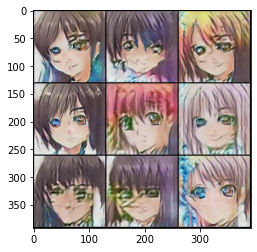

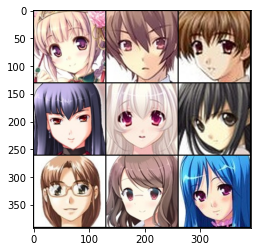

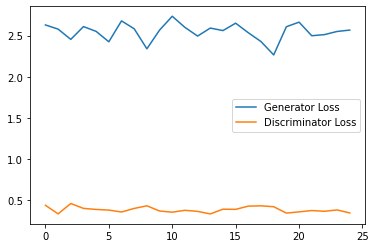

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 1, step 1000: Generator loss: 2.668765868604183, discriminator loss: 0.35665097242593813


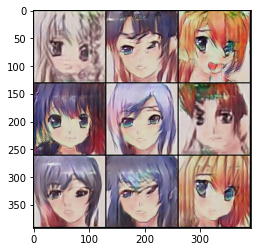

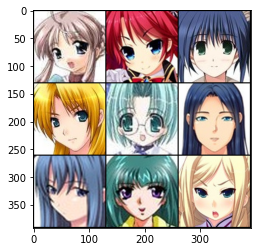

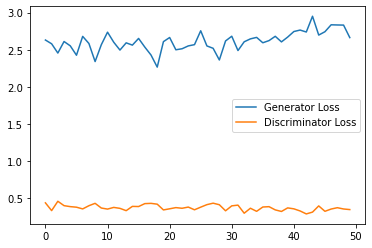

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 2, step 1500: Generator loss: 2.745170027911662, discriminator loss: 0.333604253619909


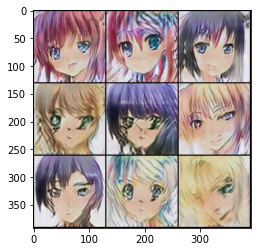

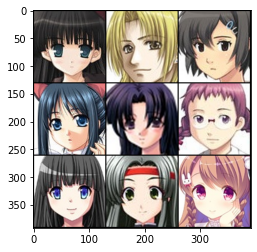

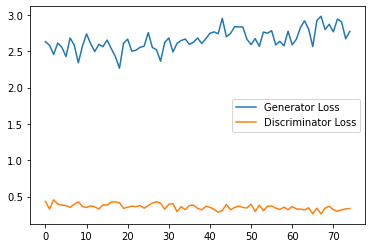

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 3, step 2000: Generator loss: 2.7976233828663815, discriminator loss: 0.32865723252296464


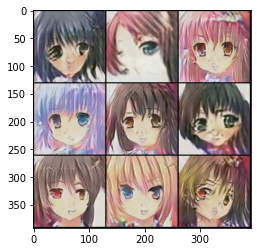

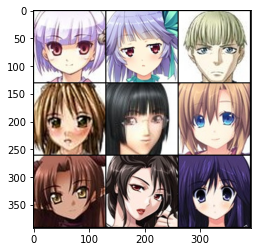

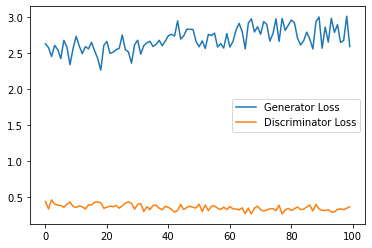

Epoch 3, step 2500: Generator loss: 2.766870364069939, discriminator loss: 0.3128602874130008


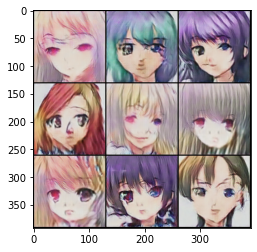

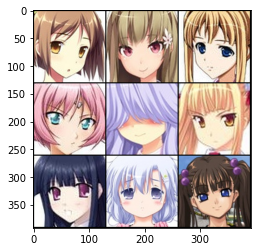

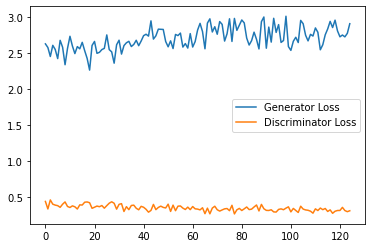

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 4, step 3000: Generator loss: 2.7967451454401036, discriminator loss: 0.2971538720726966


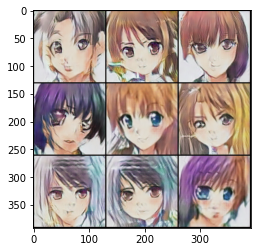

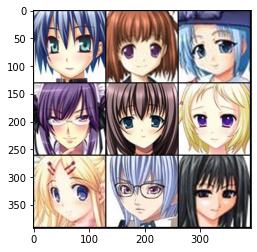

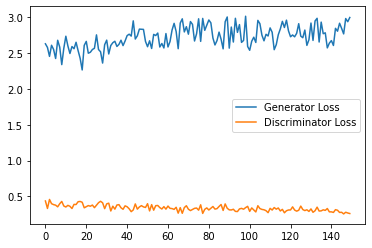

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 5, step 3500: Generator loss: 2.9547534174919137, discriminator loss: 0.27488026410341276


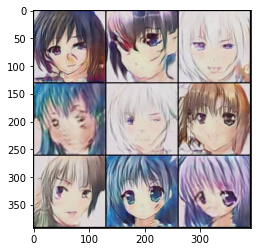

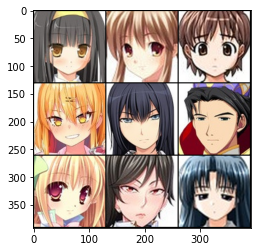

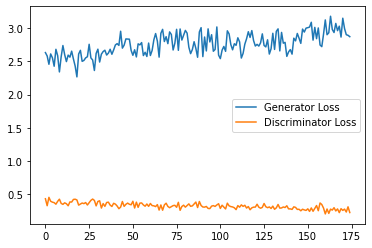

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 6, step 4000: Generator loss: 2.9610957964062687, discriminator loss: 0.27394252239912753


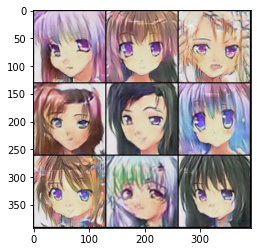

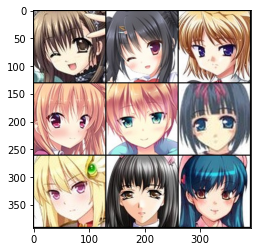

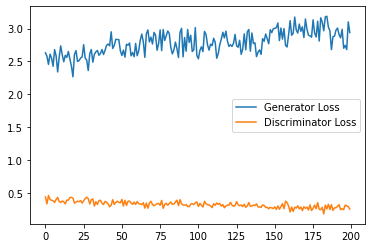

Epoch 6, step 4500: Generator loss: 3.0325718579590344, discriminator loss: 0.2572044800519947


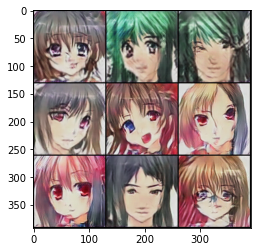

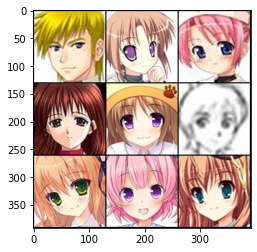

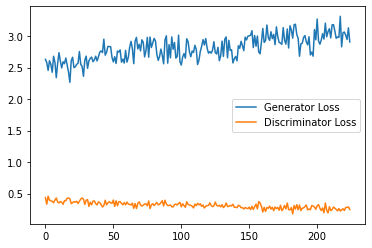

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 7, step 5000: Generator loss: 3.16226305949688, discriminator loss: 0.242452079348266


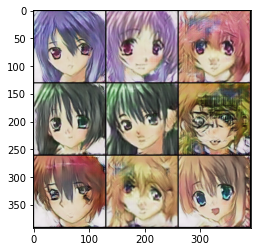

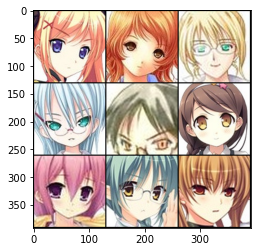

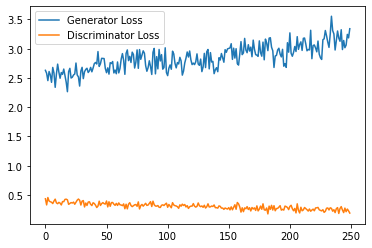

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 8, step 5500: Generator loss: 3.275379821717742, discriminator loss: 0.22667523914575577


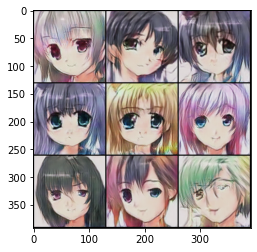

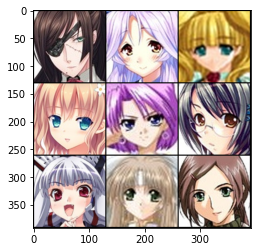

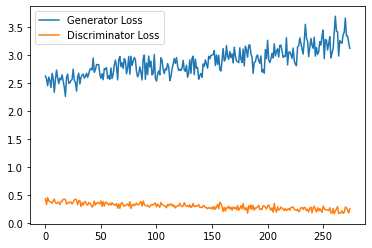

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 9, step 6000: Generator loss: 3.2052000834941836, discriminator loss: 0.2231699248999358


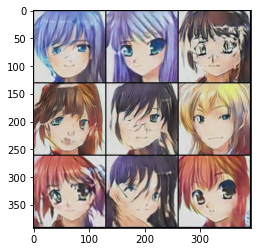

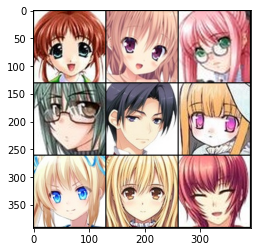

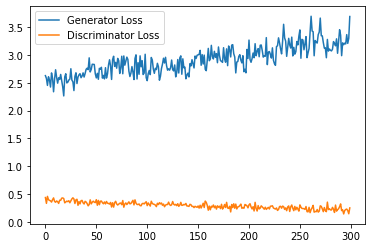

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 10, step 6500: Generator loss: 3.384191565990449, discriminator loss: 0.21589620802551515


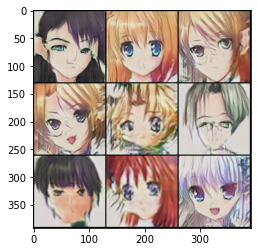

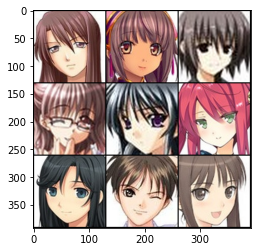

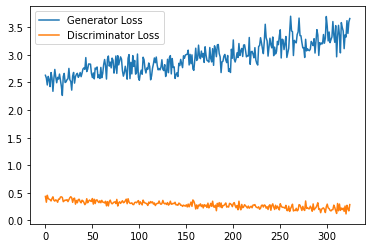

Epoch 10, step 7000: Generator loss: 3.2985054283142063, discriminator loss: 0.20559132225438959


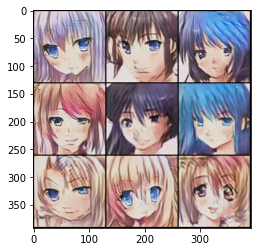

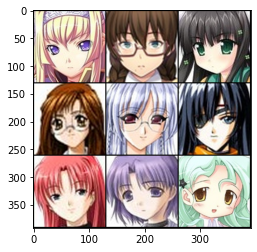

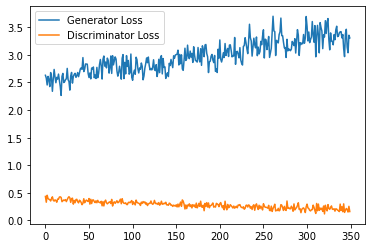

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 11, step 7500: Generator loss: 3.4937218299508093, discriminator loss: 0.1916351842954755


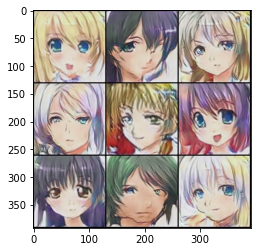

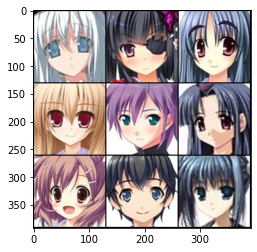

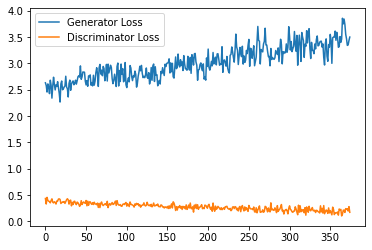

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 12, step 8000: Generator loss: 3.478000263750552, discriminator loss: 0.1962691923566164


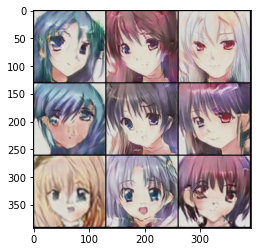

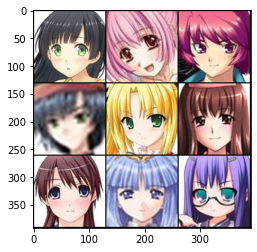

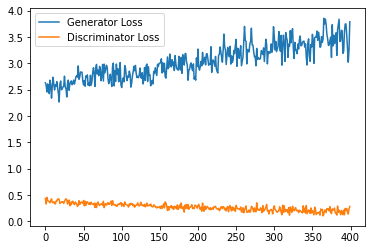

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 13, step 8500: Generator loss: 3.55376741540432, discriminator loss: 0.1729397105574609


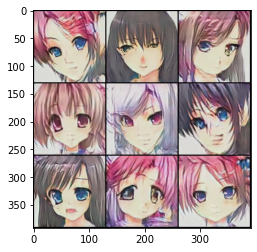

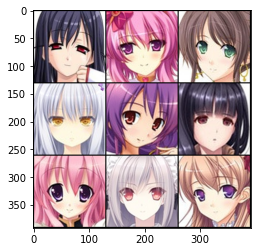

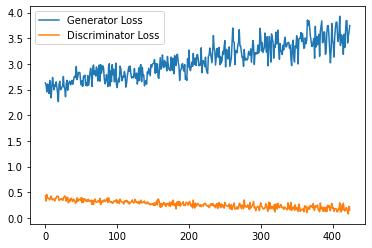

Epoch 13, step 9000: Generator loss: 3.681478115588426, discriminator loss: 0.18171010204404595


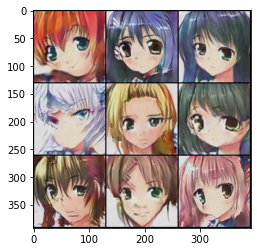

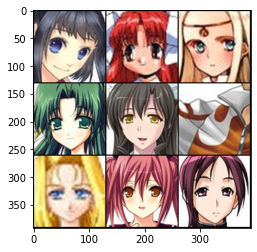

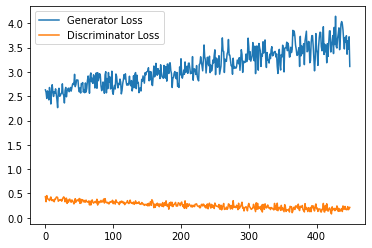

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 14, step 9500: Generator loss: 3.7472005524039256, discriminator loss: 0.16332067910209305


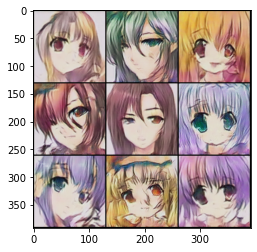

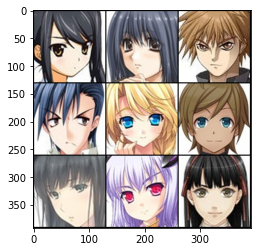

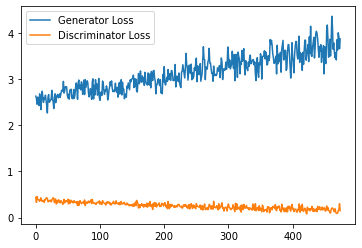

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 15, step 10000: Generator loss: 3.7849928847998364, discriminator loss: 0.17488091305643325


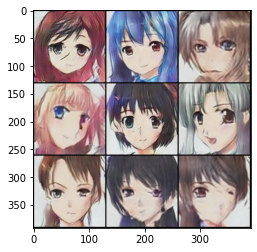

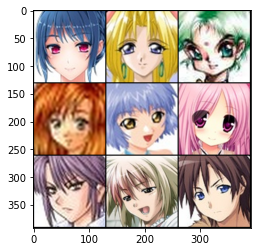

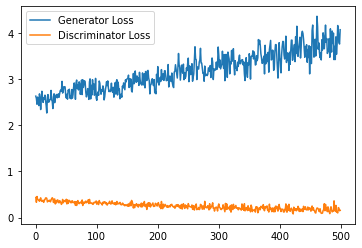

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 16, step 10500: Generator loss: 3.917999070048328, discriminator loss: 0.15329531602934007


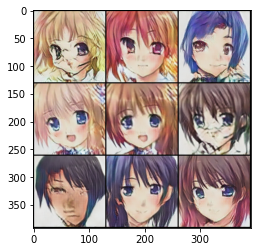

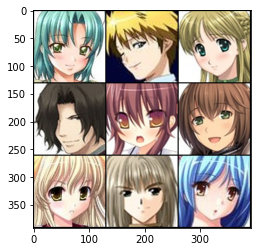

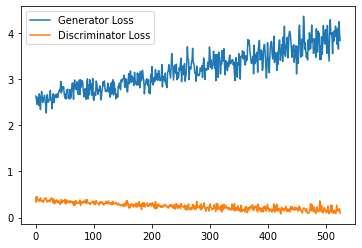

Epoch 16, step 11000: Generator loss: 3.970171486571429, discriminator loss: 0.14649347745254646


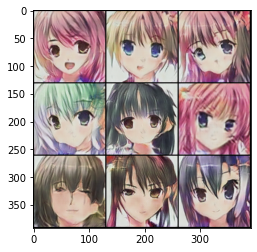

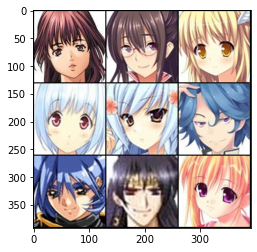

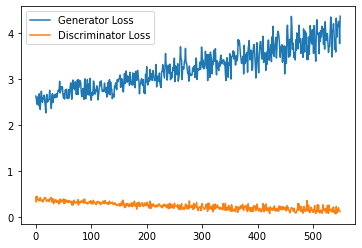

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 17, step 11500: Generator loss: 3.9512727834619534, discriminator loss: 0.15264962745085356


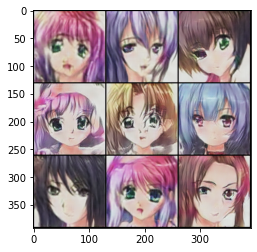

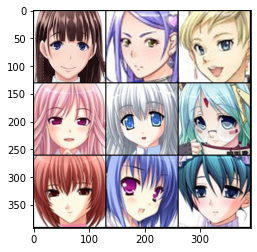

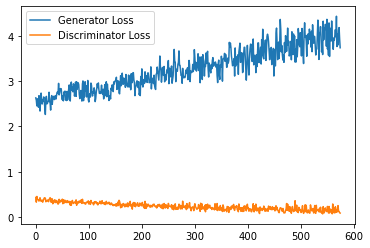

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 18, step 12000: Generator loss: 3.9682935116887115, discriminator loss: 0.14001776129379867


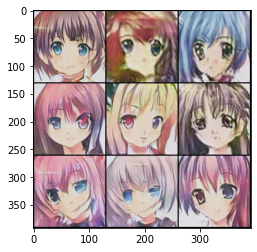

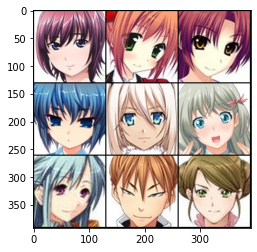

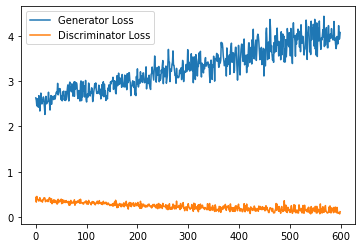

  0%|          | 0/648 [00:03<?, ?it/s]

Epoch 19, step 12500: Generator loss: 4.088338326185936, discriminator loss: 0.1563943567704411


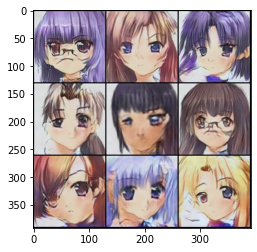

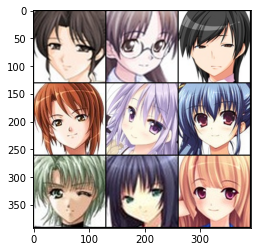

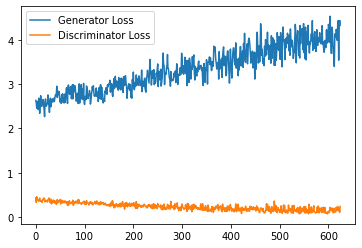

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 20, step 13000: Generator loss: 3.996489384174348, discriminator loss: 0.1361410969868303


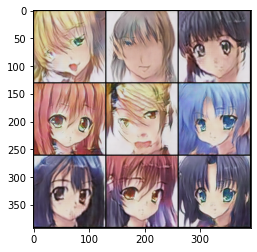

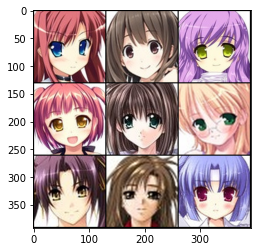

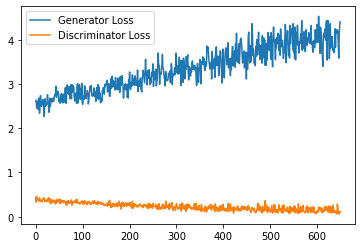

Epoch 20, step 13500: Generator loss: 4.114766949743035, discriminator loss: 0.14588179636746654


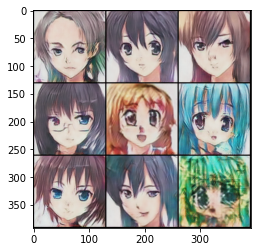

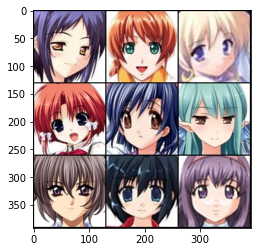

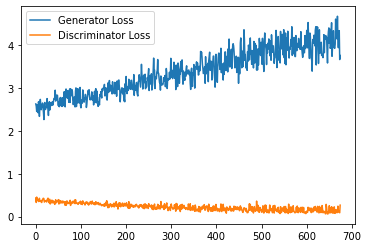

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 21, step 14000: Generator loss: 4.124438271522519, discriminator loss: 0.13586981678567822


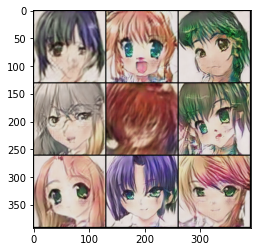

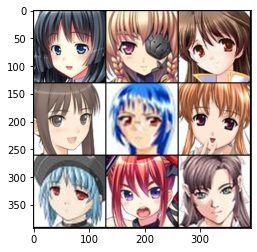

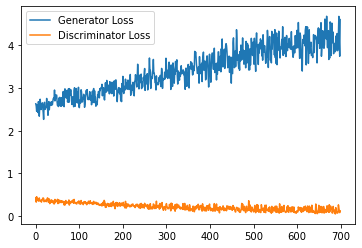

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 22, step 14500: Generator loss: 4.217779991954568, discriminator loss: 0.1333489618860184


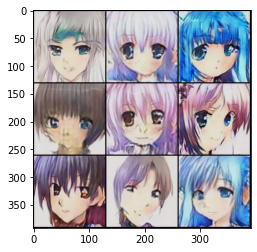

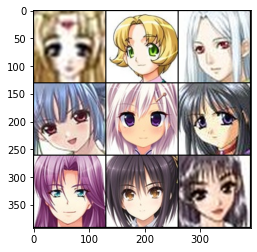

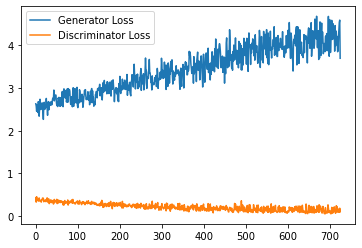

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 23, step 15000: Generator loss: 4.243910317808389, discriminator loss: 0.12876164725609124


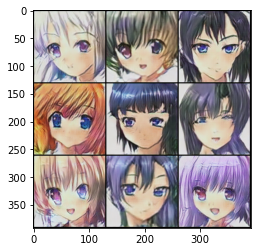

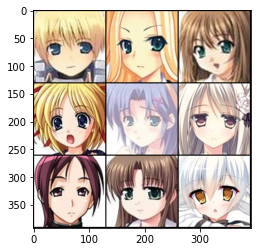

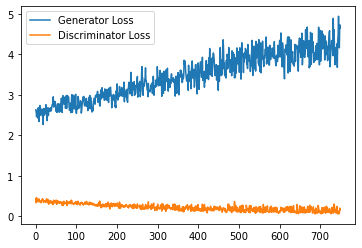

Epoch 23, step 15500: Generator loss: 4.423633696734906, discriminator loss: 0.12085787544772023


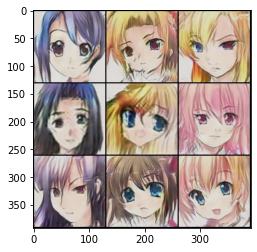

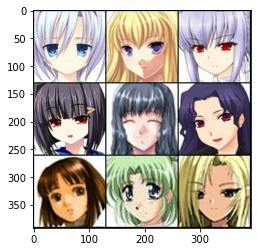

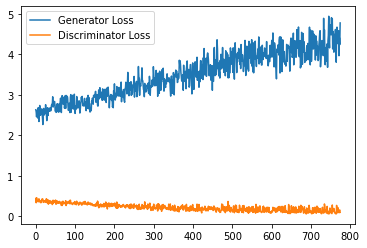

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 24, step 16000: Generator loss: 4.373022047027948, discriminator loss: 0.11904140180908145


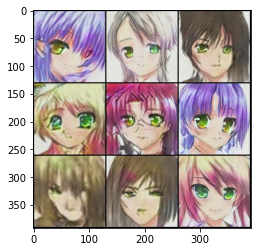

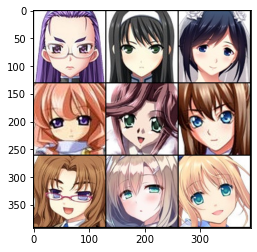

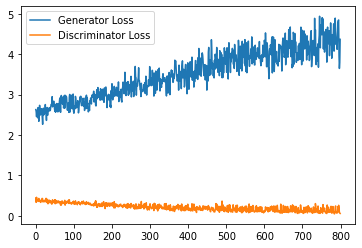

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 25, step 16500: Generator loss: 4.480222272001202, discriminator loss: 0.10062818649597467


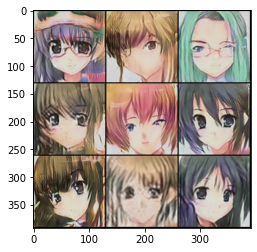

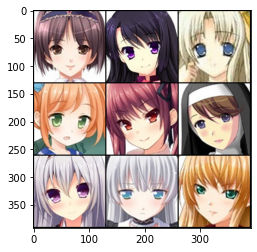

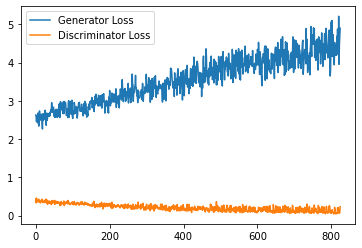

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 26, step 17000: Generator loss: 4.46736505141668, discriminator loss: 0.1185166773833334


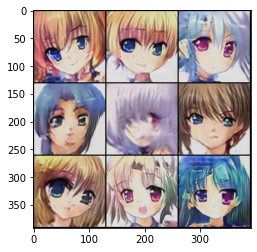

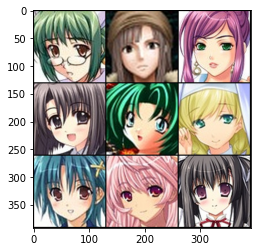

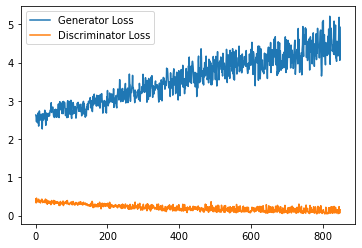

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 27, step 17500: Generator loss: 4.516138153195385, discriminator loss: 0.11012394773960113


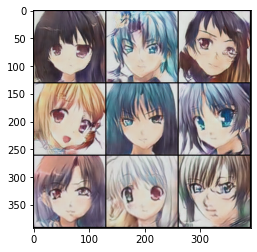

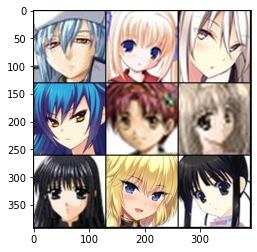

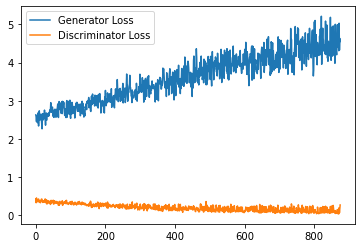

Epoch 27, step 18000: Generator loss: 4.56352368028462, discriminator loss: 0.11074857824295764


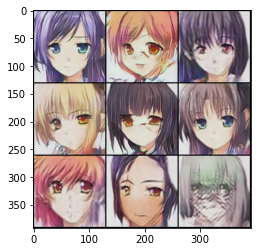

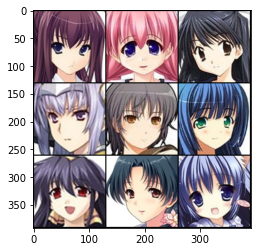

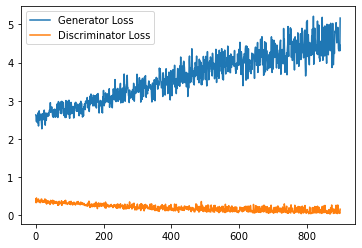

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 28, step 18500: Generator loss: 4.690648611962796, discriminator loss: 0.10912290080729886


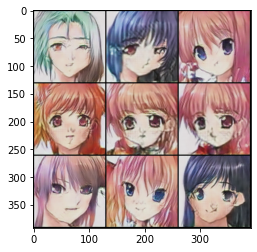

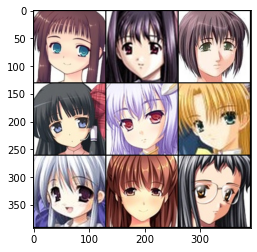

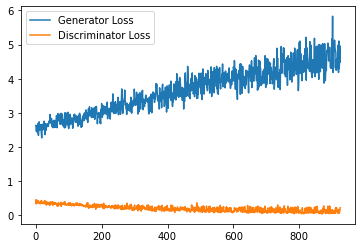

  0%|          | 0/648 [00:03<?, ?it/s]

Epoch 29, step 19000: Generator loss: 4.810590083099898, discriminator loss: 0.10373914913227777


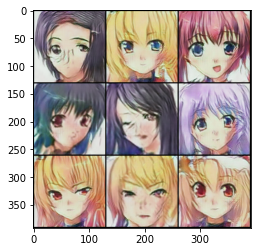

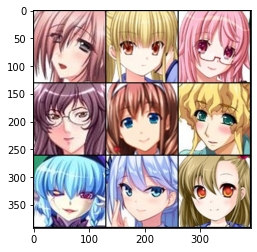

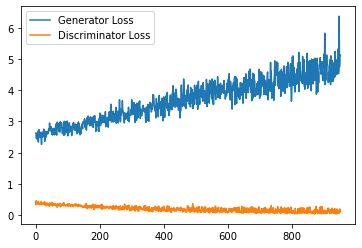

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 30, step 19500: Generator loss: 4.7162534389570325, discriminator loss: 0.10151774179190405


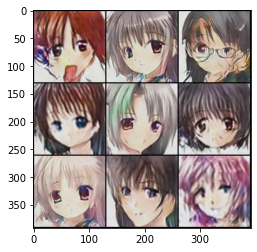

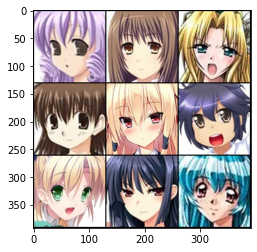

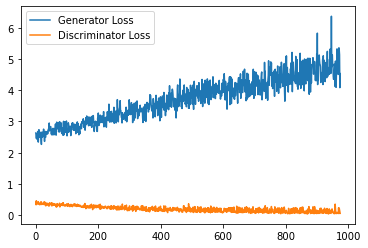

Epoch 30, step 20000: Generator loss: 4.735347764402627, discriminator loss: 0.09699327308405194


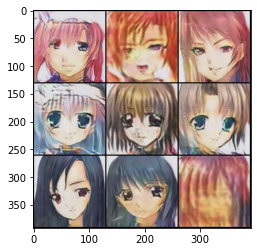

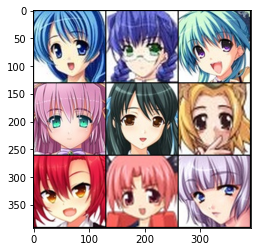

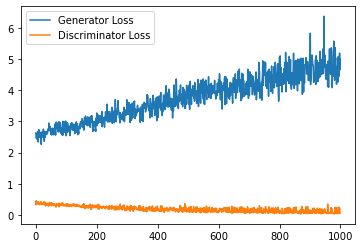

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 31, step 20500: Generator loss: 4.6852912958860395, discriminator loss: 0.09731092999689292


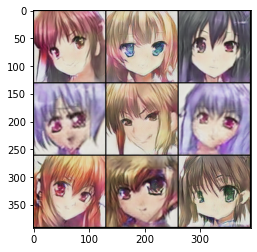

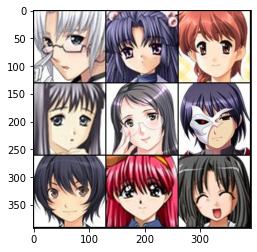

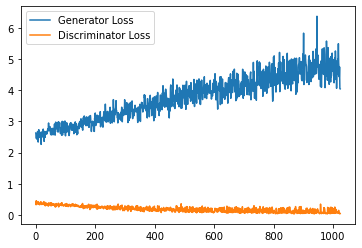

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 32, step 21000: Generator loss: 4.846313779029997, discriminator loss: 0.1048398514692671


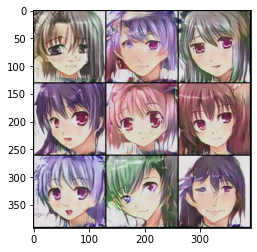

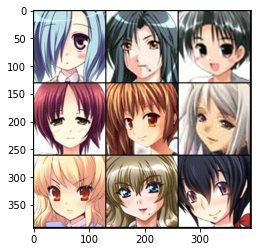

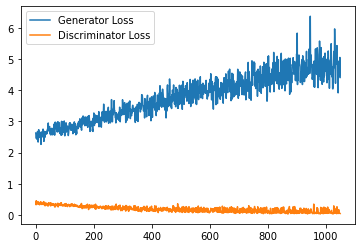

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 33, step 21500: Generator loss: 4.936338713139298, discriminator loss: 0.09965934479702254


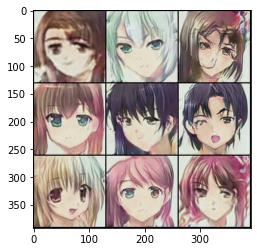

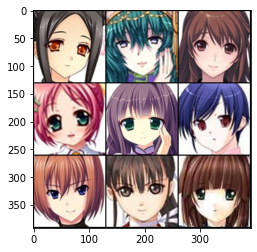

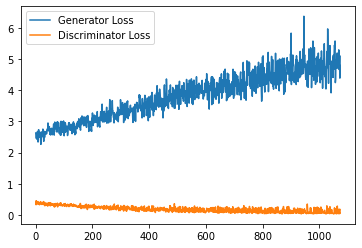

Epoch 33, step 22000: Generator loss: 4.706919045507908, discriminator loss: 0.10858692735247312


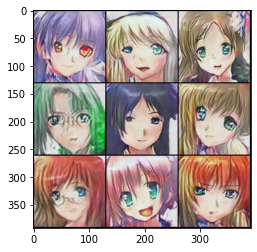

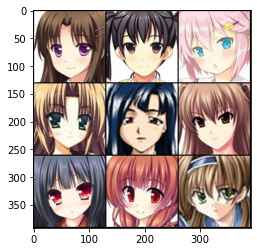

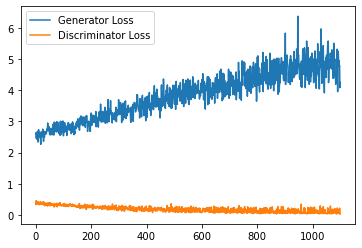

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 34, step 22500: Generator loss: 4.694226335003972, discriminator loss: 0.0926599273155443


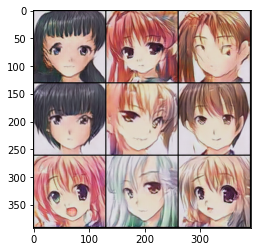

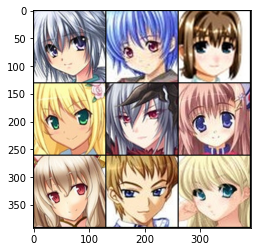

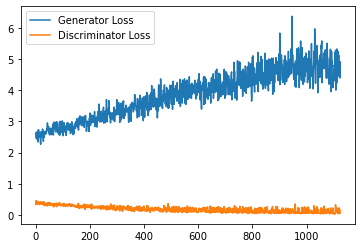

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 35, step 23000: Generator loss: 4.9380446743369095, discriminator loss: 0.0865365798221901


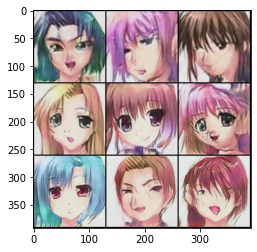

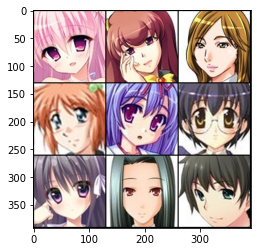

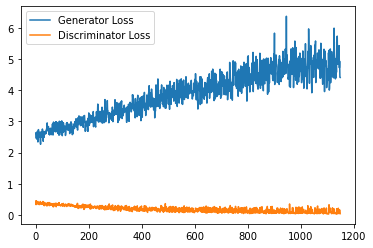

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 36, step 23500: Generator loss: 5.132815577063708, discriminator loss: 0.08680225279601304


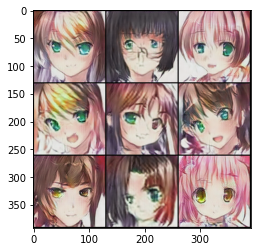

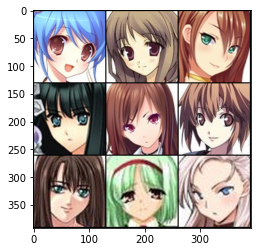

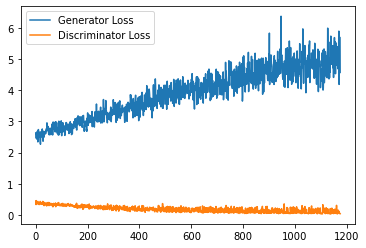

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 37, step 24000: Generator loss: 4.99141530431807, discriminator loss: 0.08365861264662819


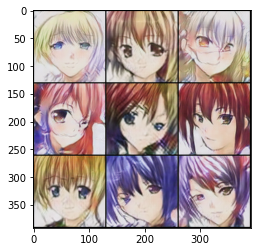

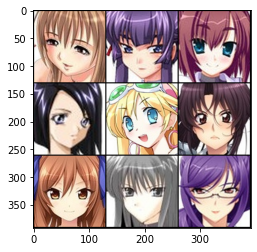

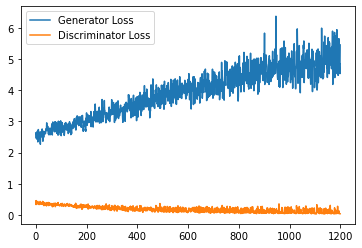

Epoch 37, step 24500: Generator loss: 5.171489302426582, discriminator loss: 0.10791990490944582


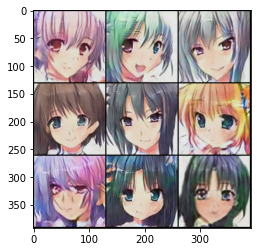

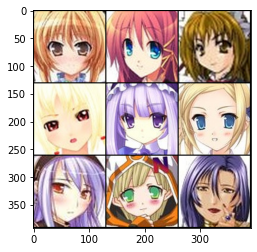

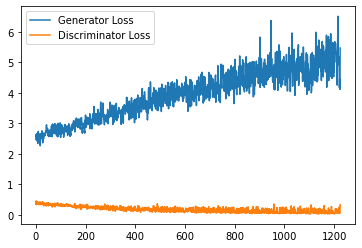

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 38, step 25000: Generator loss: 4.750907867823731, discriminator loss: 0.07568606231594459


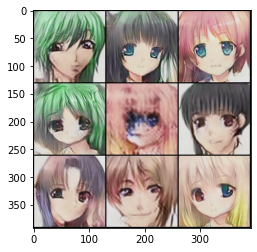

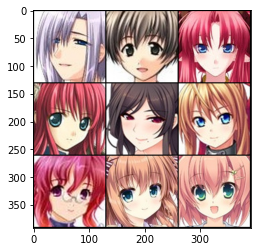

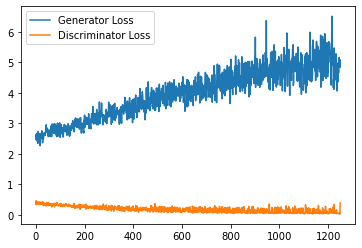

  0%|          | 0/648 [00:04<?, ?it/s]

Epoch 39, step 25500: Generator loss: 5.142840026386088, discriminator loss: 0.07519052710453977


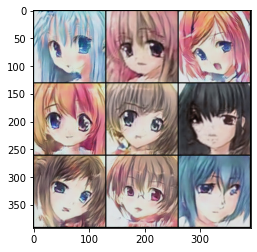

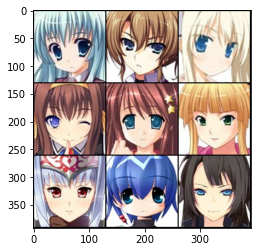

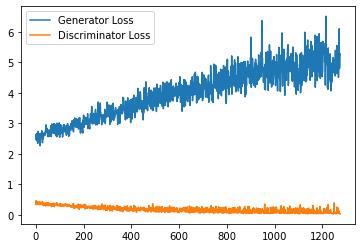

In [15]:

# Listas donde se almacena los valores de perdida de la red 
# generadora y discriminadora, los cuales se usaran para graficar
# la funciones de perdida cada 500 pasos

G_losses = []
D_losses = []



num_epochs = 40
display_step = 500

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0

for epoch in range(num_epochs):
    
    for real, _ in tqdm(dt_loader):
        
        # cur_batch_size: Cantidad de datos del batch del dataloader?
        cur_batch_size = len(real) 
        # real: iterador
        real = real.to(device)
        
        #######################################
        ##   Actualizamos el discriminador   ##
        #######################################
        
        # devolvemos a cero las gradientes
        dis_optim.zero_grad()   #####
        
        # fake_noise: nuevo vector de ruido para el batch de datos
        fake_noise = noise_generator(cur_batch_size, dim_z, device=device) ####
        
        # Introducimos el tensor de ruido al generador
        fake = anime_gen(fake_noise)
        
        # Obtenemos la predicción del discriminador de los datos falsos
        ###   D(G(z))
        disc_fake_pred = anime_dis(fake.detach())
        #Obs: Detach <> ¿puntero al tensor?
        
        # Obtenemos la predicción del discriminador de los datos reales
        ###   D(G(z))
        disc_real_pred = anime_dis(real)
        
        # Obtenemos los valores de pérdida al evaluar los datos falsos
        # Básicamente etiqueta a la distribución de estos datos como falsa
        # al darles como valor 0
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        
        # Obtenemos los valores de pérdida al evaluar los datos reales
        # Básicamente etiqueta a la distribución de estos datos como verdadero
        # al darles como valor 1
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        
        # Obtenemos la media general de las pérdidas en esta iteración
        disc_loss = (disc_fake_loss.float() + disc_real_loss.float()) / 2

        # Obtenemos el promedio ponderado de la pérdida del 
        # discriminador 
        mean_discriminator_loss += disc_loss.item()/display_step
        
        
        # Actualizamos gradientes
        # retain_graph=True permite mantener la pérdida durante el proceso
        disc_loss.backward(retain_graph=True)
        
        # Actualizamos el optimizador
        dis_optim.step()

        
        ###################################
        ##   Actualizamos el generador   ##
        ###################################
        
        # devolvemos a cero las gradientes
        gen_optim.zero_grad()
        
        # Creamos un nuevo tensor de ruido para el generador
        fake_noise_2 = noise_generator(cur_batch_size, dim_z, device=device)
        
        # Obtenemos el resultado de evaluar el tensor en el modelo
        fake_2 = anime_gen(fake_noise_2)
        
        # Obtenemos nuevamente la predicción del Discriminador
        disc_fake_pred = anime_dis(fake_2)
        
        # Obtenemos la evaluación de la función de pérdida 
        # Buscamos etiquetar nuestros datos falsos como verdaderos
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        
        # Actualizamos gradientes de la función de pérdida del generador
        gen_loss.backward()
        
        # Actualizamos el optimizador
        gen_optim.step()
        
        
        # Obtenemos el promedio ponderado de la pérdida del 
        # generador 
        mean_generator_loss += gen_loss.item()/ display_step

        # Guardamos los valores de pérdida para su ploteo
        G_losses.append(gen_loss.item())
        D_losses.append(disc_loss.item())
        
        ## 
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)
            display_losses(cur_step, display_step, G_losses, D_losses)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
        
#     if epoch % 2 == 0:
#         torch.save({
#                 'epoch': epoch,
#                 'model_state_dict': anime_gen.state_dict(),
#                 'optimizer_state_dict': gen_optim.state_dict(),
#                 'loss': G_losses,
#                 }, 'generator_anime_G4_v5.pt')
#         torch.save({
#                 'epoch': epoch,
#                 'model_state_dict': anime_dis.state_dict(),
#                 'optimizer_state_dict': dis_optim.state_dict(),
#                 'loss': D_losses,
#                 }, 'discriminator_anime_G4_v5.pt')

In [14]:
checkpoint1 = torch.load('generator_anime_G4_v5.pt')
anime_gen.load_state_dict(checkpoint1['model_state_dict'])
gen_optim.load_state_dict(checkpoint1['optimizer_state_dict'])
epoch = checkpoint1['epoch']
G_losses = checkpoint1['loss']
anime_gen.train()


checkpoint2 = torch.load('discriminator_anime_G4_v5.pt')
anime_dis.load_state_dict(checkpoint2['model_state_dict'])
dis_optim.load_state_dict(checkpoint2['optimizer_state_dict'])
epoch = checkpoint2['epoch']
D_losses = checkpoint2['loss']
anime_dis.train()

redDiscriminadora(
  (main): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.05, inplace=True)
      (3): MaxPool2d(kernel_size=7, stride=2, padding=1, dilation=1, ceil_mode=False)
    )
    (1): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.05, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.05, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1),

In [ ]:
num_epochs = 40
display_step = 500

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0

for epoch in range(num_epochs):
    
    for real, _ in tqdm(dt_loader):
        
        # cur_batch_size: Cantidad de datos del batch del dataloader?
        cur_batch_size = len(real) 
        
        # fake_noise: nuevo vector de ruido para el batch de datos
        fake_noise = noise_generator(cur_batch_size, dim_z, device=device) ####
        
        # Introducimos el tensor de ruido al generador
        fake = anime_gen(fake_noise)
        show_tensor_images(fake)
        
    break